# Evaluation of Google Dynamic World Time Series

This notebook evaluates the feasibility of monitor land cover change at high spatial and temporal resolution using Google’s Dynamic World dataset for applications such as ESG reporting, Natural Capital Accounting, and tracking progress toward sustainable development goals.

For further context, explanations and description of analysis, please refer to the corresponding [Medium article](https://medium.com/@c.r.williams0109/improving-temporal-consistency-in-google-dynamic-world-land-cover-time-series-9c593dad796f).

In [1]:
import ee
import geemap
import geemap.colormaps as cm

In [2]:
import os
import sys
import pandas as pd
import geopandas as gpd

from munch import Munch
from shapely.geometry import Polygon
#from IPython.display import Image

import seaborn as sns
import matplotlib.pyplot as plt

### Setup working environment

In [3]:
# define repo name and get root working directory
repo = 'dynamicworld'
root_path = os.getcwd()[ 0 : os.getcwd().find( repo ) + len ( repo ) ]

In [4]:
# add src sub dir to system path
sys.path.append( os.path.join( root_path, 'src' ) )

In [5]:
# import local helper classes
from dw import DynamicWorld
from metrics import Metrics
from viz import Viz

### Initialise Earth Engine API

In [6]:
try:
    # initialise earth engine api
    ee.Initialize( project='test4ei' )
    
except BaseException as e:
    
    # reauthenticate and initialise earth engine api on error
    ee.Authenticate()    
    ee.Initialize( project='test4ei' )

### Initialise arbitrary region of interest and timeframe

In [7]:
# home
coords = [ [ -2.8, 51.3], 
           [ -2.8, 51.1],
           [ -2.4, 51.1],
           [ -2.4, 51.3 ] ]

In [8]:
# load coordinates into geodataframe - determine utm zone
gdf = gpd.GeoDataFrame( index=[0], crs='EPSG:4326', geometry=[ Polygon(coords) ] )
zone = gdf.estimate_utm_crs().to_epsg()
zone

32630

In [9]:
# convert total bounds into earth engine region of interest
roi = ee.Geometry.Rectangle( tuple( gdf.total_bounds ) )

### Utility Functions

In [10]:
def get_datasets( roi, intervals ):

    """
    Get Dynamic World datasets
    
    Parameters        
    ----------
    roi : ee.Geometry
        region of interest
    intervals : dict
        start and end dates

    Returns
    -------
    List :
        Temporally aggregated DynamicWorld datasets encoded as dicts
    """

    # iterate over intervals
    datasets = []
    for interval in intervals:

        # get dynamic images collated with roi and temporal window
        collection = DynamicWorld.get_data( roi, interval[ 'start' ], interval[ 'end' ] )

        # add mode and max median land cover maps to list combined with interval
        datasets.append( {
                        'mode' : DynamicWorld.add_metadata( DynamicWorld.get_mode_label( collection ), interval ),
                        'max_median' :DynamicWorld.add_metadata( DynamicWorld.get_max_median_label( collection ), interval )
                    }   | interval
        )

    return datasets

In [11]:
def get_stratified_sample_data( dataset, num_samples=1000 ):

    """
    Randomly sample variables based on class label
    
    Parameters        
    ----------
    dataset : dict
        object comprising mode and max median composite images with label band

    Returns
    -------
    FeatureCollection :
        Mode and max median sample values indexed according to class and method
    """

    def get_samples( image ):    
        return image.stratifiedSample(
            numPoints=num_samples,
            classBand='label',
            region=roi,
            scale=10,
            geometries=False,
            seed=42
        )
    
    # get mode and max_median samples
    samples = get_samples( dataset[ 'mode' ] ).map(lambda f: f.set( 'method', 'mode') )
    return samples.merge( get_samples( dataset[ 'max_median' ] ).map(lambda f: f.set( 'method', 'max_median') ) )

### Visualise interannual and seasonal variability across Dynamic World dataset

In [12]:
# get quarterly intervals between 2018-2024
intervals = DynamicWorld.get_intervals( '2018-01-01', '2024-12-31', '3M' )

In [13]:
def is_summer_interval( interval ):

    # convert to datetime
    start = pd.to_datetime( interval[ 'start' ] )
    end = pd.to_datetime( interval[ 'end' ] )

    # identify spring and summer intervals
    return start.month >= 4 and end.month <= 9 and start.year == end.year

# filter intervals
summer_intervals = [ i for i in intervals if is_summer_interval(i) ]

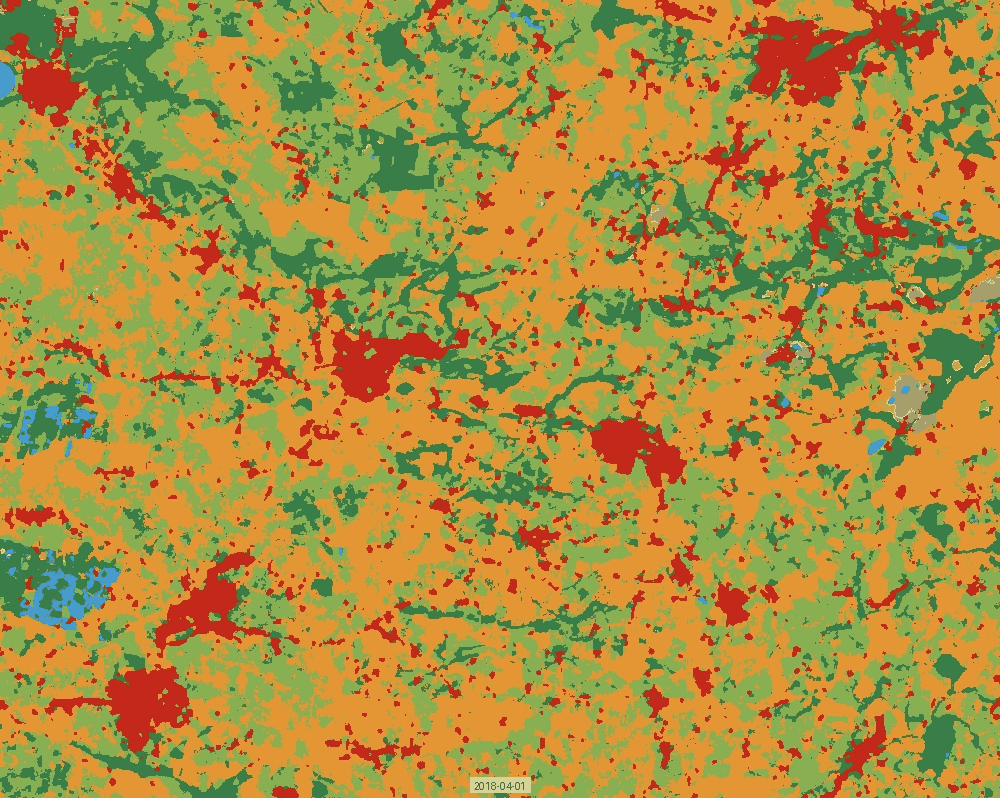

In [14]:
# get mode aggregated collection for spring and summer months 2018 - 2024
datasets = get_datasets( roi, summer_intervals )
collection = ee.ImageCollection.fromImages( [ d[ 'mode' ].select( 'label' ) for d in datasets ] ) 

# plot animation
Viz.get_annotated_animation(collection, region=roi, dimensions=1024 )

In [15]:
# create animated gif
Viz.get_annotated_animation(collection, region=roi, fps=0.5, dimensions=(1000,1000), out_pathname='avatar.gif' )

GIF saved to avatar.gif


'avatar.gif'

### Interactively compare land cover labels for spring and summer in 2022

In [16]:
# spring and summer 2022
intervals = [ {'start': '2022-04-01', 'end': '2022-06-30', 'name' : 'Q2 2022'},
              {'start': '2022-07-01', 'end': '2022-09-30', 'name' : 'Q3 2022'} ]

# get dynamic world datasets collocated with spatiotemporal constraints
datasets = get_datasets( roi, intervals )

In [17]:
# display differences between spring and summer
m = Viz.plot_label_images( datasets, roi )
m

Map(center=[51.20009810245082, -2.5999999999991954], controls=(WidgetControl(options=['position', 'transparent…

### Generate animated gifs comparing spatial heterogenity of mode and max median composites

In [18]:
for idx, out_pathname in enumerate( [ 'q2.gif', 'q3.gif' ] ):

    # plot animated gif
    collection = ee.ImageCollection.fromImages( [ datasets[ idx ][ 'mode' ].select( 'label' ), 
                                                  datasets[ idx ][ 'max_median' ].select( 'label' ) ] )
    Viz.get_annotated_animation(collection, 
                                region=roi, 
                                fps=0.5,
                                dimensions=768, 
                                annotation=[ 'mode', 'max median' ],
                                out_pathname=out_pathname )

GIF saved to q2.gif
GIF saved to q3.gif


### Evaluate differences between mode and max median aggregated land cover maps

In [19]:
# take first dataset
dataset = datasets[ 0 ]

# set up confusion matrix bands
reference = dataset[ 'mode' ].select( 'label' )
prediction = dataset[ 'max_median' ].select( 'label' )

# compute error matrix and accuracy
em, accuracy = Metrics.get_error_matrix( reference, prediction, region=roi )
accuracy

0.9302139695031972

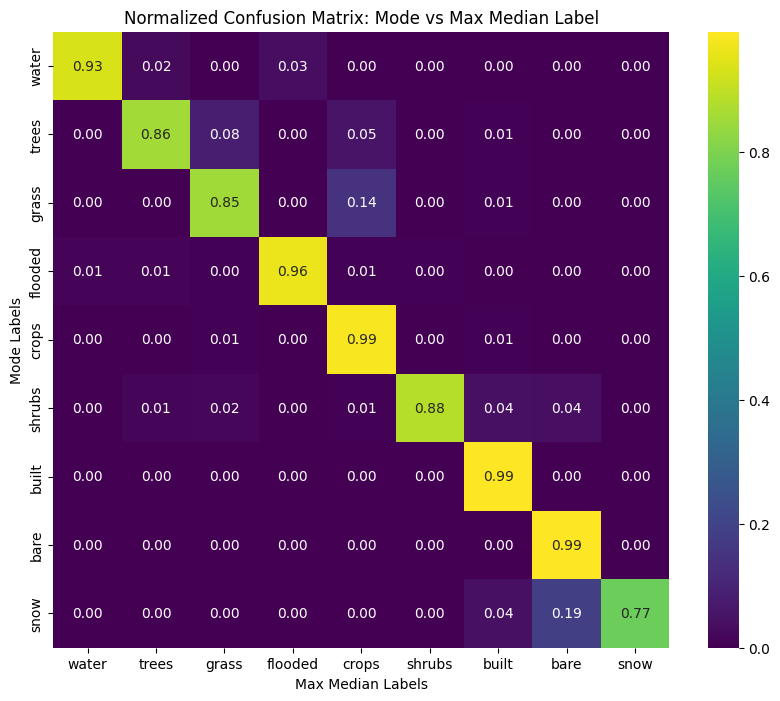

In [20]:
# plot confusion matrix
plt.figure(figsize=(10, 8))

# get normalised error matrix
norm_em = Metrics.get_normalised_error_matrix( em, list( DynamicWorld.legend.keys() ) )
ax = sns.heatmap( norm_em, 
             annot=True, 
             cmap='viridis', 
             fmt='.2f',
             square=True,
             annot_kws={"size": 10} )

ax.set_xticklabels( norm_em.columns, fontsize=10 )
ax.set_yticklabels( norm_em.index, fontsize=10 )

ax.set_xlabel('Max Median Labels')
ax.set_ylabel('Mode Labels')
_ = ax.set_title('Normalized Confusion Matrix: Mode vs Max Median Label')

### Assess probability distribution functions of mode and max-median confidence values

In [21]:
# get sample data stratified by class label
df = geemap.ee_to_df( get_stratified_sample_data( datasets[ 0 ] ) )

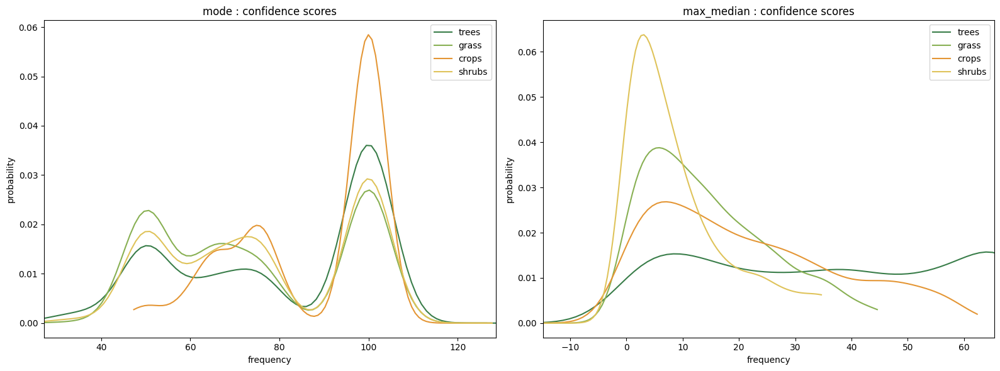

In [22]:
# plot confidence pdfs
Viz.plot_class_confidence_pdf( df, [ 'trees', 'crops', 'shrubs', 'grass' ] )
plt.tight_layout()

### Compute consistency of land cover over mode and max median composite time series

In [23]:
# get late spring / summer interval timeseries
intervals = []
for year in range( 2017, 2025 ):
    intervals.append( {'start': f'{year}-05-01', 'end': f'{year}-08-31'} )

# get quarterly intervals between 2018-2024
intervals = DynamicWorld.get_intervals( '2018-01-01', '2024-12-31', '12M' )

In [24]:
# get dynamic world datasets collocated with spatiotemporal constraints
datasets = get_datasets( roi, intervals )

In [25]:
# get label images for mode and max_median aggregated datasets
label = {
        'mode' : ee.ImageCollection.fromImages( [ d[ 'mode' ].select( 'label' ) for d in datasets ] ),
        'max_median' : ee.ImageCollection.fromImages( [ d[ 'max_median' ].select( 'label' ) for d in datasets ] )
}

In [26]:
def get_temporal_consistency( collection ):
    # compute consistency as number of class label transitions across time series
    return collection.reduce( ee.Reducer.countRuns() )

In [27]:
# compute consistency of interannual mode and max median interannual time series
consistency = {
        'mode' : get_temporal_consistency( label[ 'mode' ] ).rename( 'consistency' ),
        'max_median' : get_temporal_consistency( label[ 'max_median' ] ).rename( 'consistency' )
}

### Compare temporal consistency of mode and max median composites across different land cover classes

In [28]:
def get_consistency_counts( fc ):

    # convert to dataframe and compute value counts by label groups
    df = geemap.ee_to_df( fc )
    df = df[ df.label != 8 ]
    df = df.groupby('label' )['consistency'].value_counts().reset_index()

    # remap integer codes to legend strings
    lut = dict( zip( list( range( len( DynamicWorld.legend.keys() ) ) ), list( DynamicWorld.legend.keys() ) ) )
    df[ 'label' ] = df[ 'label' ].map ( lut )

    return df    

In [29]:
# get quarterly intervals between 2018-2024
datasets = get_datasets( roi, [ { 'start' : '2018-03-01', 'end' : '2018-10-31' } ] )

# get stratified samples
samples = {}
for method in [ 'mode', 'max_median' ]:
    
    image = consistency[ method ].addBands( datasets[ 0 ][ method ].select( 'label' ) )
    samples[ method ] = image.stratifiedSample (
            numPoints=1000,
            classBand='label',
            region=roi,
            scale=10,
            geometries=False,
            seed=42
    )

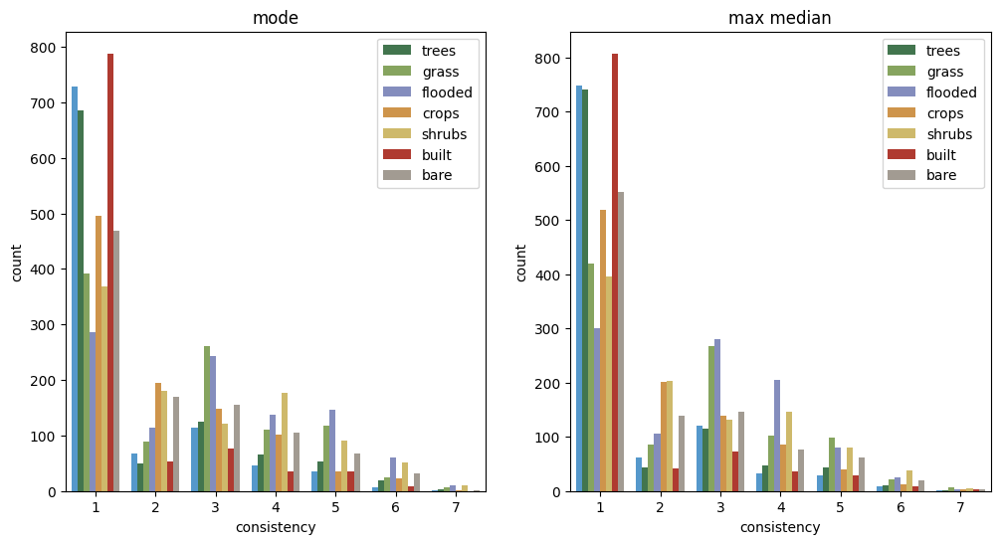

In [30]:
# plot histograms of consistency count
_, axes = plt.subplots( 1, 2, figsize=(12,6) )
for idx, method in enumerate( [ 'mode', 'max_median' ] ):
    
    sns.barplot( data=get_consistency_counts( samples[ method ] ), 
                 x='consistency', 
                 y='count', 
                 hue='label', 
                 palette=list( DynamicWorld.legend.values() ), 
                 ax=axes[idx] )

    # remove title
    handles, labels = axes[ idx ].get_legend_handles_labels()
    axes[ idx ].legend(handles=handles[1:], labels=labels[1:])

    axes[ idx ].set_title( f'{method.replace( "_", " " )}' )


### Visualise temporal consistency of mode and max median aggregated interannual time series

In [31]:
# create map
m = geemap.Map( center=roi.centroid().coordinates().getInfo()[::-1], zoom=10, add_google_map=False )

# display mode and max median consistency image layers
m.addLayer( consistency [ 'mode' ], { 'min' : 0, 'max' : 5, 'palette': cm.palettes.viridis }, 'mode', True )
m.addLayer( consistency [ 'max_median' ], { 'min' : 0, 'max' : 5, 'palette': cm.palettes.viridis }, 'max median', True )

# add layer control and centre to roi
m.add_layer_control()
m

Map(center=[51.20009810245082, -2.5999999999991954], controls=(WidgetControl(options=['position', 'transparent…

### Evaluate impact of temporal smoothing on interannual consistency

In [32]:
def apply_temporal_smoothing( collection, **kwargs ):

    # parse parameters + defaults from dict
    window_size = kwargs.get( 'window_size', 2 )
    start_year = kwargs.get( 'start_year', 2017 )
    end_year = kwargs.get( 'start_year', 2024 )

    # iterate for each year
    images = []
    for year in range( start_year, end_year + 1 ):

        # filter collection for moving temporal window
        subset = collection.select( 'label' ) \
                            .filterDate(f'{year-window_size}-01-01', 
                                       f'{year+window_size}-12-31' )

        # get range of date filter
        d1 = ee.Date( f'{year}-01-01' )
        d2 = ee.Date( f'{year}-12-31' )

        # add start and end dates as metafields
        meta = ee.Dictionary( { 'system:time_start' : d1.millis(), \
                                    'system:time_end' : d2.millis() } )

        # compute mode of collection subset + add to list
        images.append( subset.mode().rename( subset.first().bandNames() ).set( meta ) )
        
    return ee.ImageCollection.fromImages( images )

In [33]:
# compute temporally smoothed max median aggregated interannual time series
label[ 'max_median_smooth' ] = apply_temporal_smoothing( label[ 'max_median' ] )

In [34]:
# compute consistency of temporally smoothed max median aggregated interannual time series
consistency[ 'max_median_smooth' ] = get_temporal_consistency( label[ 'max_median_smooth' ] ).rename( 'consistency' )

In [35]:
# get stratified samples
image = consistency[ 'max_median_smooth' ].addBands( datasets[ 0 ][ 'max_median' ].select( 'label' ) )
samples[ 'max_median_smooth' ] = image.stratifiedSample (
        numPoints=1000,
        classBand='label',
        region=roi,
        scale=10,
        geometries=False,
        seed=42
)

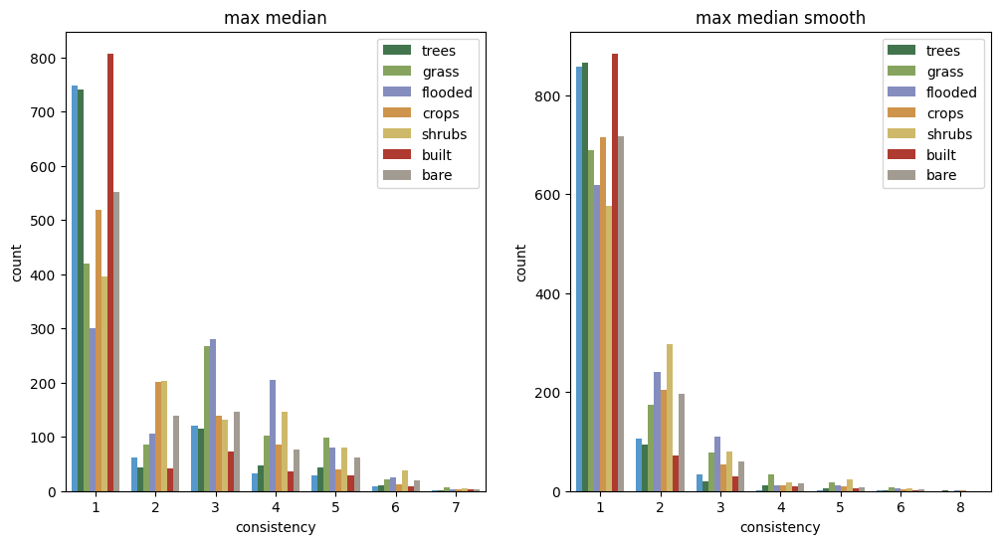

In [36]:
# plot histograms of consistency count
_, axes = plt.subplots( 1, 2, figsize=(12,6) )
for idx, method in enumerate( [ 'max_median', 'max_median_smooth' ] ):
    
    sns.barplot( data=get_consistency_counts( samples[ method ] ), 
                 x='consistency', 
                 y='count', 
                 hue='label', 
                 palette=list( DynamicWorld.legend.values() ), 
                 ax=axes[idx] )

    # remove title
    handles, labels = axes[ idx ].get_legend_handles_labels()
    axes[ idx ].legend(handles=handles[1:], labels=labels[1:])

    axes[ idx ].set_title( f'{method.replace( "_", " " )}' )


### Visualise impact of temporal smoothing on max median composite 

In [37]:
m = geemap.Map( center=roi.centroid().coordinates().getInfo()[::-1], zoom=10, add_google_map=False )

# legend keys and values
keys = list( DynamicWorld.legend.keys() )
colors = list( DynamicWorld.legend.values() )

# convert collections to lists
max_median = label[ 'max_median' ].toList( label[ 'max_median' ].size() )
max_median_smooth = label[ 'max_median_smooth' ].toList( label[ 'max_median_smooth' ].size() )

# add successive max median raw and consistency layers
m.addLayer( ee.Image( max_median.get(2) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'raw 2019', True )
m.addLayer( ee.Image( max_median.get(3) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'raw 2020', False )
m.addLayer( ee.Image( max_median.get(4) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'raw 2021', False )
m.addLayer( consistency[ 'max_median' ], { 'min' : 1, 'max' : 4, 'palette': cm.palettes.viridis }, 'consistency raw', False )

# add successive max median smoothed layers
m.addLayer( ee.Image( max_median_smooth.get( 2 ) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'smooth 2019', True )
m.addLayer( ee.Image( max_median_smooth.get( 3 ) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'smooth 2020', False )
m.addLayer( ee.Image( max_median_smooth.get( 4 ) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'smooth 2021', False )
m.addLayer( consistency[ 'max_median_smooth' ], { 'min' : 1, 'max' : 4, 'palette': cm.palettes.viridis }, 'consistency smooth', False )
    
# add legend
m.add_legend( keys=keys, colors=colors, position='bottomleft')

# add layer control and centre to roi
m.add_layer_control()
m

Map(center=[51.20009810245082, -2.5999999999991954], controls=(WidgetControl(options=['position', 'transparent…

### Visualise time series of class probabilities at location with low interannual consistency

In [38]:
# sample pixel values at location (10m scale)
def sample_point(point, image):
    return image \
        .sample(
            region=point.geometry(),
            scale=10, 
            numPixels=1
        ).first()

# iterate over images in collection, sampling points
def sample_image(image):
    return pts.map(lambda point: sample_point(point, image), True)

In [39]:
# get dynamic images collated with roi and temporal window
collection = DynamicWorld.get_data( roi, '2017-01-01', '2024-12-31' )

In [40]:
# poi
lon= -2.8456793201
lat= 51.09752525802

In [41]:
# create feature collection
pts = ee.FeatureCollection([
    ee.Feature(ee.Geometry.Point([lon, lat])),
])

# extract time series confidence values + add date
fc = collection.map(sample_image, True).flatten()
fc = fc.map( lambda feature : feature.set( 'datetime', feature.id().match('(^\d{8}T\d{6})').get(0) ) )

In [42]:
# convert feature collection samples to dataframe
df = geemap.ee_to_df( fc )
df['datetime'] = pd.to_datetime( df['datetime'], format='%Y%m%dT%H%M%S')

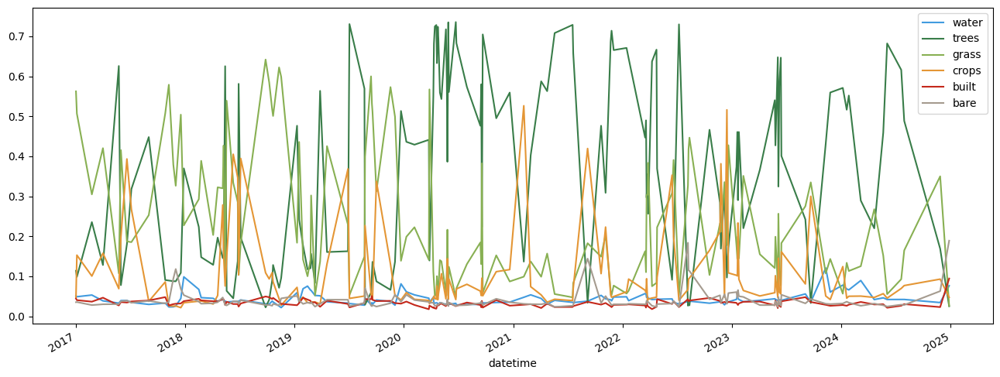

In [43]:
# plot raw time series of class confidences
fig, ax = plt.subplots( figsize=(16, 6 ) )
for k, v in DynamicWorld.legend.items():
    if k in list( df.columns ):
        ax = df.plot( x='datetime', y=k, color=v, ax=ax )

In [44]:
# add year and quarter columns
df['year'] = df['datetime'].dt.year
df['quarter'] = df['datetime'].dt.quarter

# group by year and quarter and compute median for each class
df.groupby( [ 'year', 'quarter' ] )[
    ['bare', 'built', 'crops', 'flooded_vegetation', 'grass',
     'shrub_and_scrub', 'snow_and_ice', 'trees', 'water']
].quantile(0.5).reset_index()

,year,quarter,bare,built,crops,flooded_vegetation,grass,shrub_and_scrub,snow_and_ice,trees,water
0,2017,1,0.035168,0.040280,0.100471,0.046256,0.506822,0.065738,0.033539,0.113789,0.050944
1,2017,2,0.033862,0.034930,0.177985,0.065115,0.301286,0.056442,0.035798,0.154016,0.038854
2,2017,3,0.036136,0.038198,0.152336,0.032197,0.219122,0.066703,0.040056,0.383082,0.032140
3,2017,4,0.060518,0.031650,0.025964,0.036891,0.441660,0.146165,0.035925,0.089994,0.029237
4,2018,1,0.034010,0.041608,0.037969,0.091621,0.340594,0.180224,0.031579,0.185518,0.056842
5,2018,2,0.035122,0.036252,0.146487,0.046869,0.320056,0.061368,0.026097,0.145484,0.037648
6,2018,3,0.034187,0.040676,0.251651,0.029533,0.412187,0.049383,0.036988,0.109439,0.035917
7,2018,4,0.028270,0.043134,0.085902,0.036444,0.584944,0.094160,0.038213,0.089353,0.030301
8,2019,1,0.033347,0.034607,0.035633,0.289976,0.141760,0.080934,0.028493,0.166572,0.061856
9,2019,2,0.041384,0.034966,0.249694,0.052770,0.327097,0.071209,0.026707,0.161575,0.034549
